Questao 1) escolher um sinal de audio, fazer a analise senoidal e depois resintetiza-lo

In [350]:
import librosa.core as lc
import librosa.display as ld
import librosa
import scipy
from matplotlib import pyplot as plt
import numpy as np
import os
import IPython.display as ipd
import soundfile as sf



Carregamos o arquivo

In [351]:
base_dir="AudioFiles"
file_name="há gente aqui_RED.wav"
file_path = os.path.join(base_dir,file_name)
samples, sample_rate = lc.load(file_path, sr=44100)

STFT of the original signal to pass it to the frequency domain

In [352]:
window_length=0.02 #20ms, minimum variation we (humans) can hear
nfft=int(window_length*sample_rate)

stftMat = lc.stft(samples, n_fft=nfft)

In [353]:
iStftMat = lc.istft(stftMat, hop_length=20)

powerMat = np.abs(stftMat)

ipd.Audio(samples,rate=sample_rate)

In [354]:
freqs = np.arange(0,1 + nfft/2)*sample_rate/nfft

Lets double check our frequencies with Librosa

In [355]:
def tpsw(spectrum,M = 10, N = 10,alpha=1.1):
    """
    M should be chosen such that it has the same length of the wider peaks
    alpha should be small enough such that alpha*Z is lower than the peaks and higher than noise level.
    2<alpha<8 are the recommended values
    """
    #primeira etapa
    h_sw = np.zeros(2*N - 1)
    h_sw[0:M]=1
    h_sw[2*N-1 - M:]=1
    S = scipy.signal.convolve(spectrum,h_sw)[N - 1:spectrum.shape[0] + N - 1]
    #segunda etapa
    choice_matrix = spectrum <= alpha*S
    Z = choice_matrix*spectrum 
    Z = Z -1*(choice_matrix -1)*S
    #terceira etapa, filtro de media movel
    avg_w = np.ones(2*N - 1)/(2*N - 1)
    result =  scipy.signal.convolve(Z,avg_w)[N - 1:spectrum.shape[0] + N - 1]
    return result

In [356]:
def tpsw_complete(audio_spec,M = 10, N = 30, alpha = 2):
    filtered = np.zeros([audio_spec.shape[0],audio_spec.shape[1]])    
    for i in range(audio_spec.shape[1]):
        filtered[:,i] = tpsw(audio_spec[:,i],M,N,alpha)
    return filtered

In [357]:
a = tpsw_complete(stftMat,N = 10,alpha=2,M = 5)

/Users/danielmendonca/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: ComplexWarning: Casting complex values to real discards the imaginary part
  after removing the cwd from sys.path.


In [358]:
iStftMat = lc.istft(a)

In [359]:
ipd.Audio(iStftMat,rate=sample_rate)

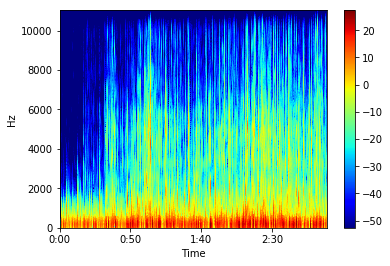

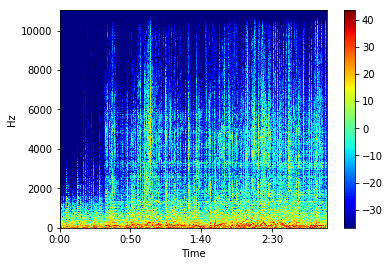

In [360]:
librosa.display.specshow(librosa.amplitude_to_db(np.abs(a)),cmap='jet',x_axis='time', y_axis='linear')
plt.colorbar()
plt.show()
librosa.display.specshow(librosa.amplitude_to_db(np.abs(stftMat)),cmap = 'jet',x_axis='time', y_axis='linear')
plt.colorbar()
plt.show()



Not sure this was supposed to happen....

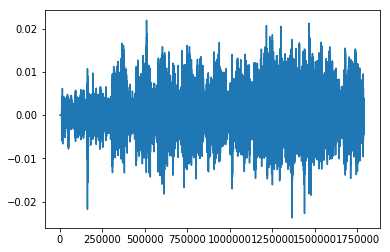

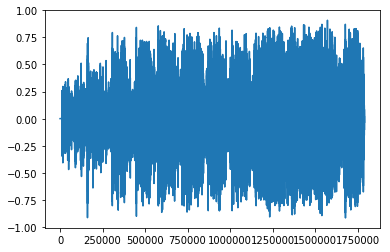

In [361]:
plt.plot(iStftMat)
plt.show()
plt.plot(samples)
plt.show()


In [362]:
S_tilted = stftMat/np.abs(a)
S_tilted = np.nan_to_num(S_tilted)
S_tilted_inv = lc.istft(S_tilted)
ipd.Audio(synt,rate=sample_rate)

/Users/danielmendonca/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


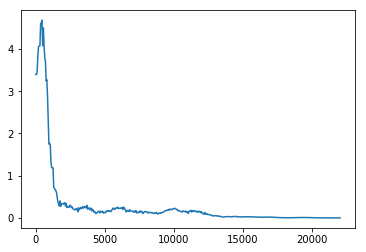

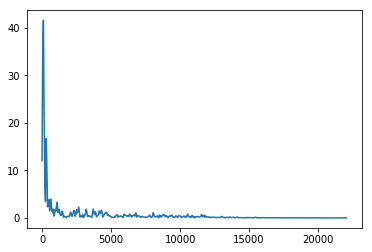

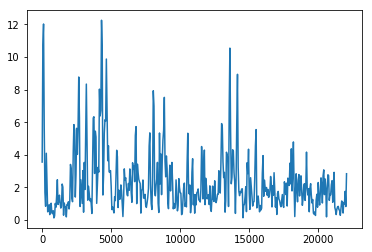

In [363]:
freqs = np.arange(0,1 + nfft/2)*sample_rate/nfft

plt.plot(freqs,np.abs(a[:,2000]))
plt.show()

plt.plot(freqs,np.abs(stftMat[:,2000]))
plt.show()

plt.plot(freqs,np.abs(S_tilted[:,2000]))
plt.show()



In [364]:
thresholds=np.abs(S_tilted).mean(axis=0)
thresholds=thresholds.reshape((1,thresholds.shape[0]))

In [365]:
choice_matrix = thresholds

In [366]:
#reducing the threshold seems to have give more accurate
thresholds = thresholds*0.5

In [367]:
b = np.repeat(thresholds,[a.shape[0]],axis=0)

In [368]:
b.shape

(442, 8138)

In [369]:
a.shape

(442, 8138)

In [370]:
choice_matrix= (S_tilted >= b)

In [371]:
choice_matrix[choice_matrix==True] = 1
choice_matrix[choice_matrix==False] = 0

In [372]:
model = stftMat*choice_matrix

In [373]:
synt = lc.istft(model)
ipd.Audio(synt,rate=sample_rate)

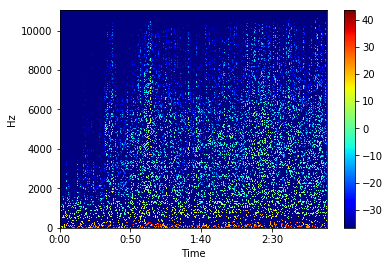

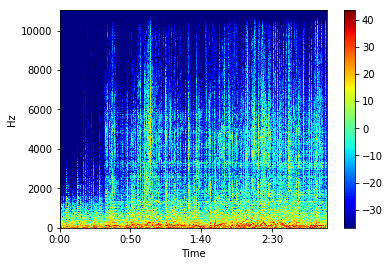

In [374]:
librosa.display.specshow(librosa.amplitude_to_db(np.abs(model)),cmap='jet',x_axis='time', y_axis='linear')
plt.colorbar()
plt.show()
librosa.display.specshow(librosa.amplitude_to_db(np.abs(stftMat)),cmap = 'jet',x_axis='time', y_axis='linear')
plt.colorbar()
plt.show()

In [375]:
 sf.write(os.path.join(base_dir,'ha gente aqui sintetizado.wav'), synt, sample_rate, 'PCM_24')